In [7]:
# dataset reading

import pandas as pd

dataset = pd.read_csv('Walmart_sales.csv')

dataset.info()

dataset.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [10]:
# fixing data types

dataset['Date'] = pd.to_datetime(dataset['Date'], format='%d-%m-%Y')
dataset['Store'] = dataset['Store'].astype('category')

dataset.info()

dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   category      
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: category(1), datetime64[ns](1), float64(5), int64(1)
memory usage: 359.7 KB


,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


### Modelos de previsão por séries temporais

#### ARIMA

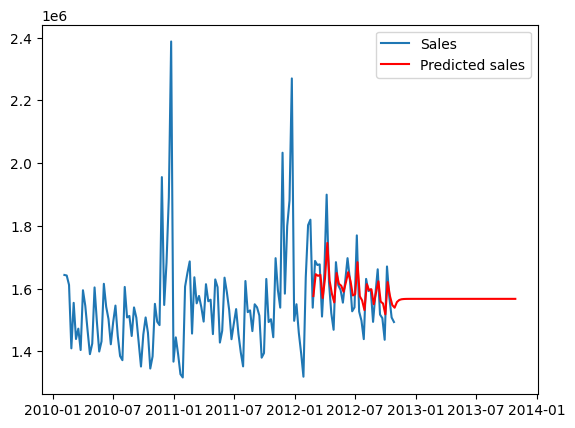

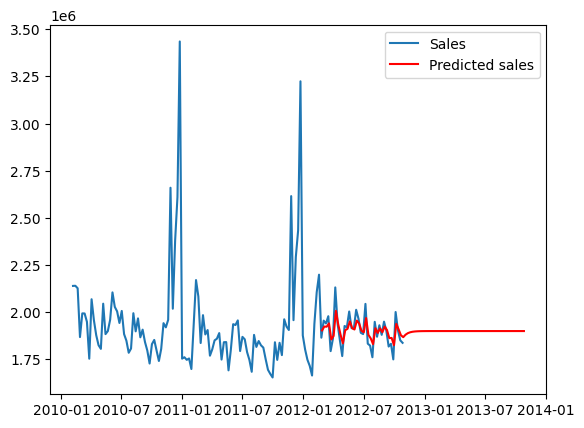

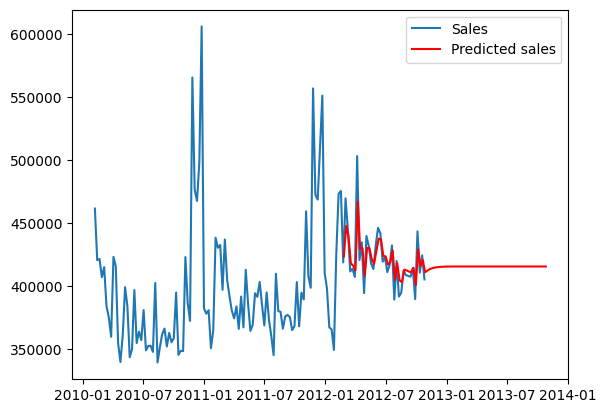

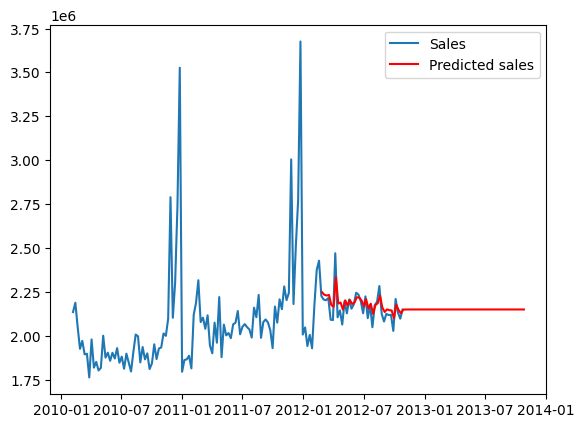

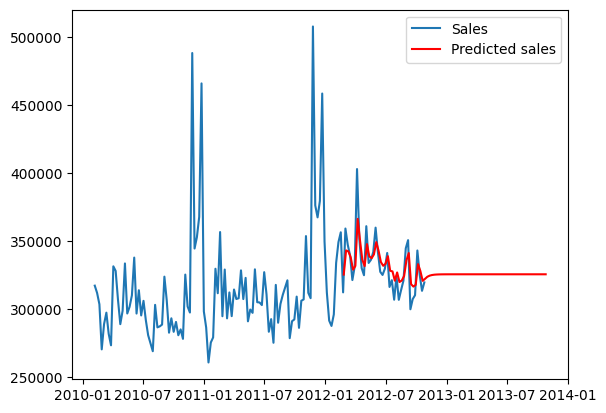

...

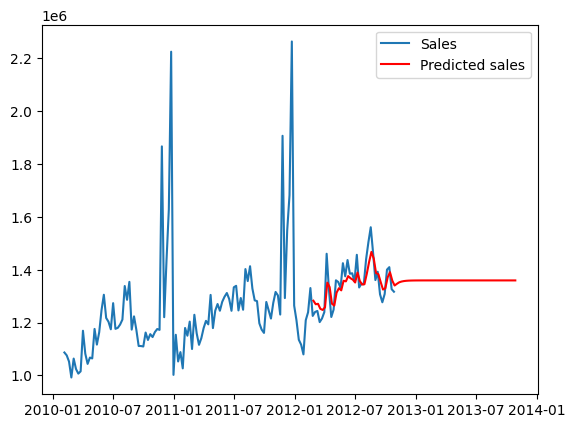

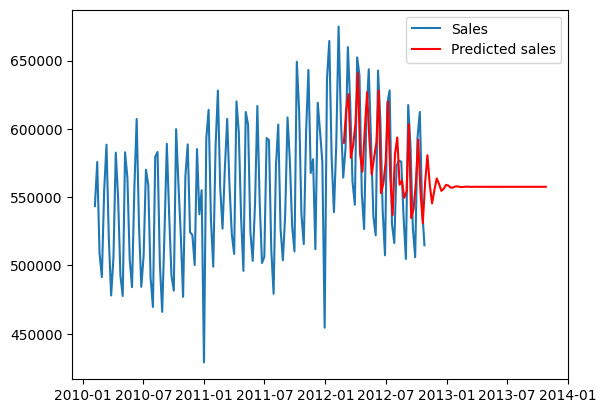

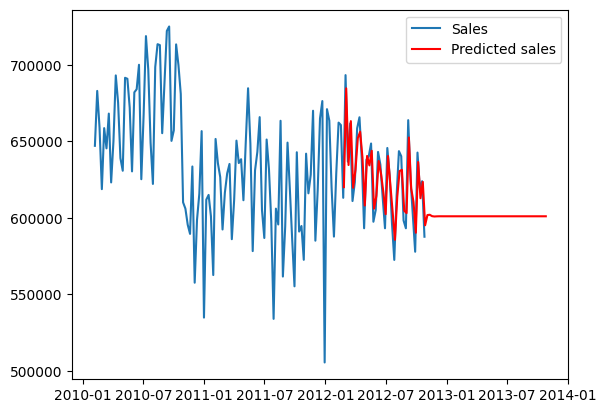

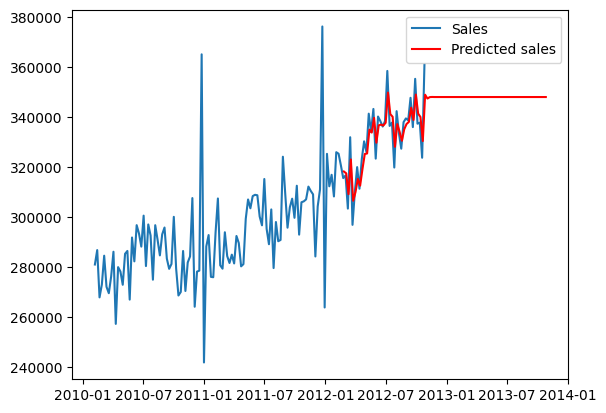

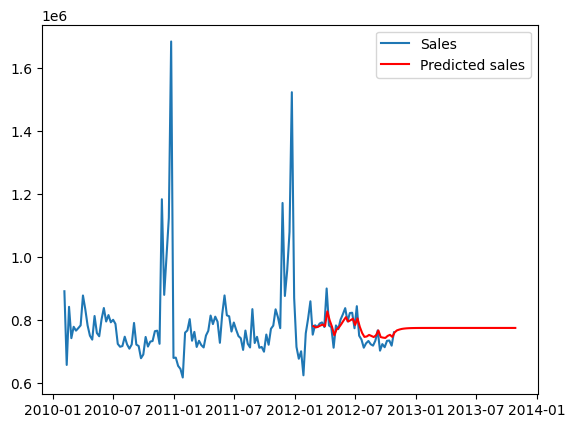

In [68]:
# ARIMA model tests

from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

for store in dataset['Store'].unique():

    tmp = dataset[dataset['Store'] == store]

    train_size = int(len(tmp) * 0.75)

    model = ARIMA(tmp['Weekly_Sales'], order=(2,1,1))
    model_fit = model.fit()

    predictions = model_fit.predict(start=train_size+1, end=tmp.shape[0]+52)

    plt.plot(tmp['Date'], tmp['Weekly_Sales'], label='Sales')
    plt.plot(pd.date_range(start=tmp.iloc[train_size]['Date'], periods=len(predictions), freq='W'), predictions, color='red', label='Predicted sales')
    plt.legend()
    plt.show()

#### RNN

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0627
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0515
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0416
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0333
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0282
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0260
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0276
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0285
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0288
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0280
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0269
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0261
Epoch 13/100
2/2 [==============================] - 0s 7m

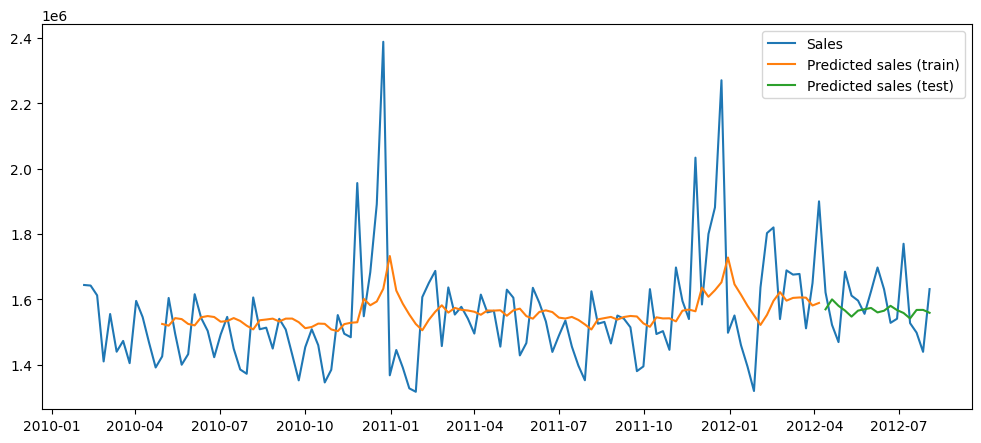

Epoch 1/100
2/2 [==============================] - 1s 8ms/step - loss: 0.0437
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0368
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0311
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0271
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0243
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0236
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0238
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0242
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0245
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0241
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0237
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0231
Epoch 13/100
2/2 [==============================] - 0s 9ms

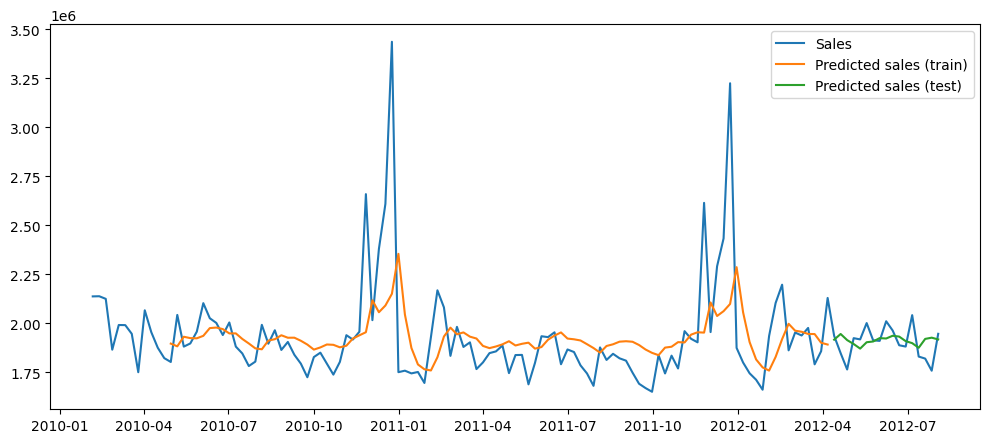

Epoch 1/100
2/2 [==============================] - 1s 8ms/step - loss: 0.0861
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0703
Epoch 3/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0574
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0464
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0381
Epoch 6/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0337
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0333
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0357
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0369
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0359
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0343
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0329
Epoch 13/100
2/2 [==============================] - 0s 8ms/s

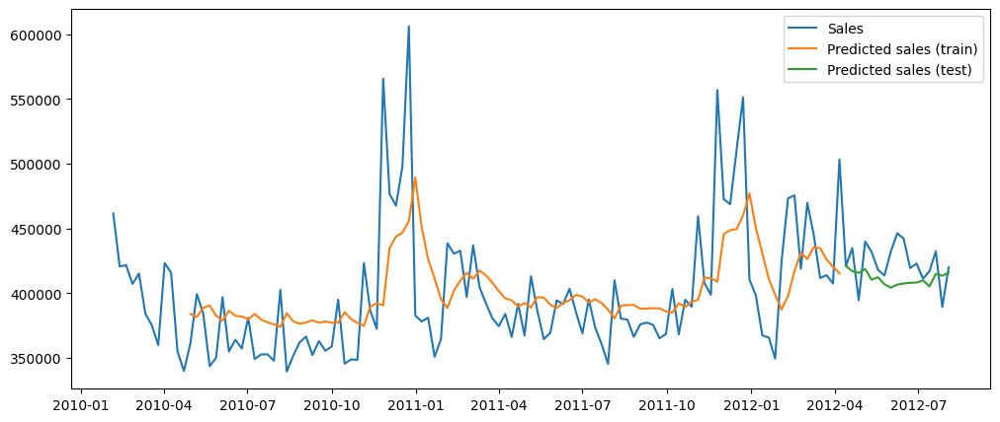

Epoch 1/100
2/2 [==============================] - 1s 9ms/step - loss: 0.0470
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0385
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0312
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0263
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0231
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0223
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0237
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0244
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0242
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0234
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0227
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0222
Epoch 13/100
2/2 [==============================] - 0s 9ms/s

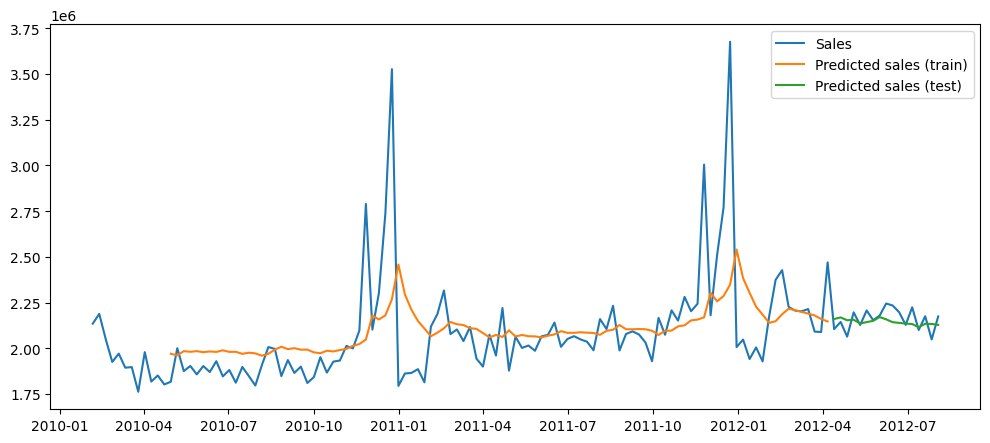

Epoch 1/100
2/2 [==============================] - 1s 9ms/step - loss: 0.0670
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0548
Epoch 3/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0441
Epoch 4/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0358
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0309
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0276
Epoch 7/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0281
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0297
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0302
Epoch 10/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0292
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0282
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0274
Epoch 13/100
2/2 [==============================] - 0s 8ms/

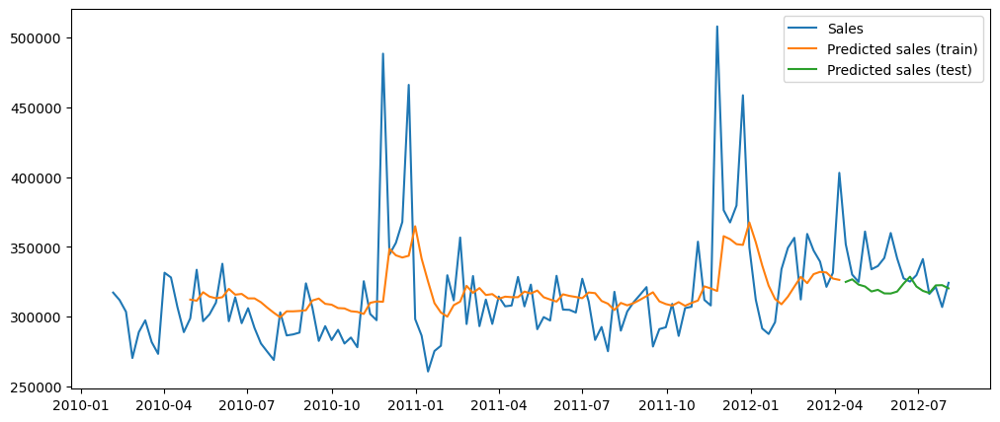

Epoch 1/100
2/2 [==============================] - 1s 9ms/step - loss: 0.0981
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0816
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0686
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0577
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0487
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0412
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0357
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0310
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0301
Epoch 10/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0300
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0315
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0320
Epoch 13/100
2/2 [==============================] - 0s

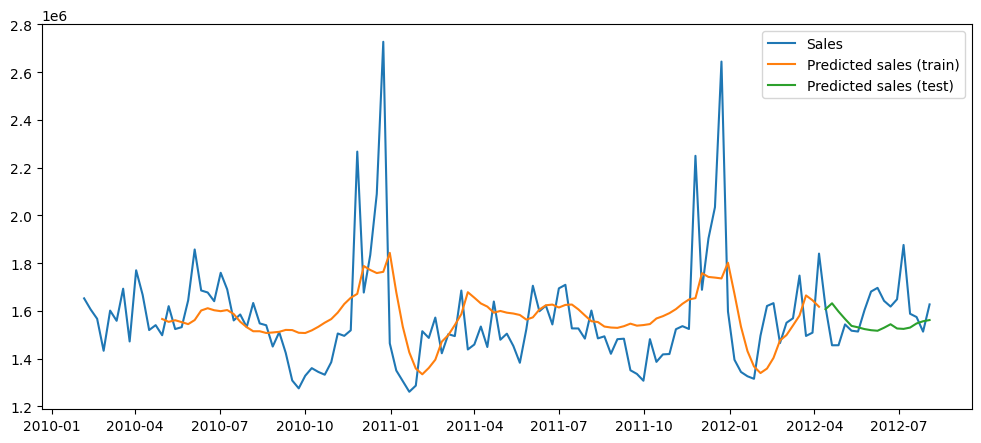

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0864
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0658
Epoch 3/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0491
Epoch 4/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0359
Epoch 5/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0291
Epoch 6/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0290
Epoch 7/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0315
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0331
Epoch 9/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0321
Epoch 10/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0301
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0282
Epoch 12/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0270
Epoch 13/100
2/2 [==============================] - 

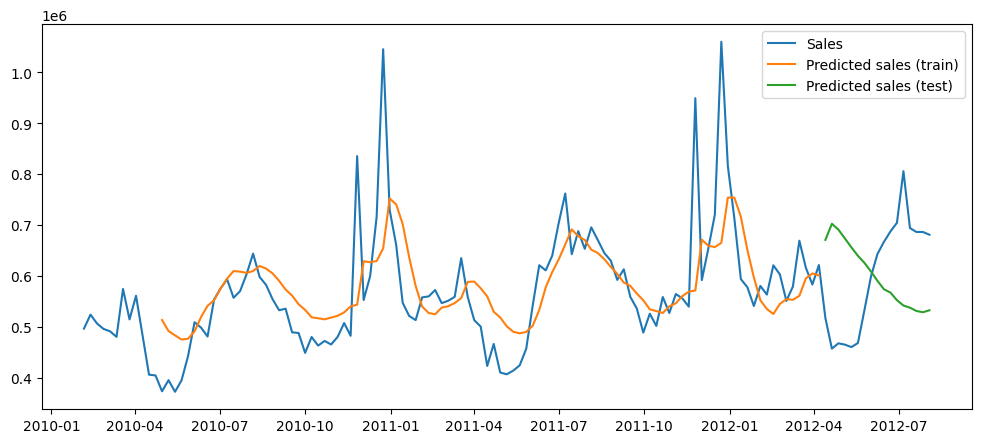

Epoch 1/100
2/2 [==============================] - 2s 11ms/step - loss: 0.0667
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0527
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0429
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0355
Epoch 5/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0295
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0283
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0278
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0291
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0299
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0297
Epoch 11/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0288
Epoch 12/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0278
Epoch 13/100
2/2 [==============================] - 

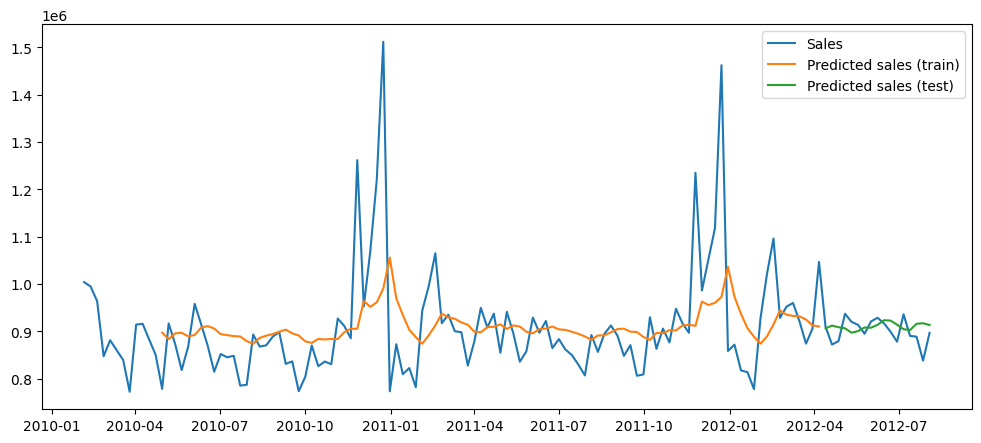

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.0826
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0666
Epoch 3/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0525
Epoch 4/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0418
Epoch 5/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0351
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0303
Epoch 7/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0309
Epoch 8/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0333
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0341
Epoch 10/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0333
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0319
Epoch 12/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0305
Epoch 13/100
2/2 [==============================]

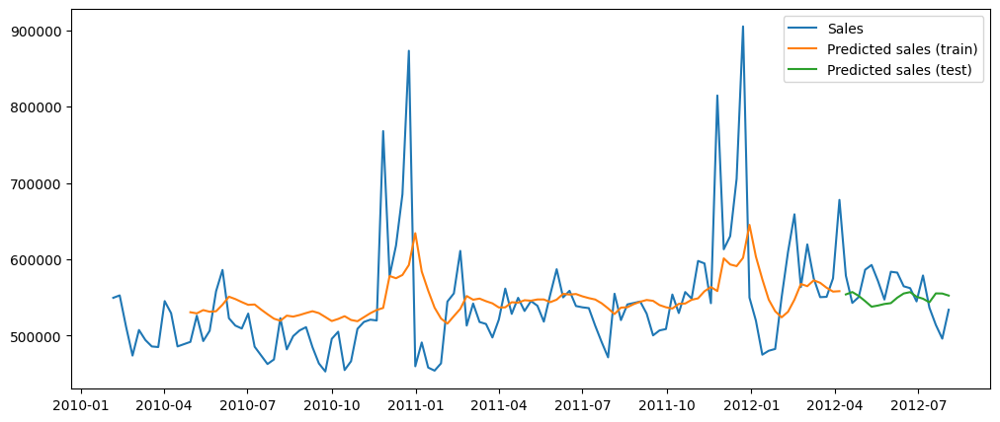

Epoch 1/100
2/2 [==============================] - 1s 10ms/step - loss: 0.0439
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0379
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0321
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0287
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0264
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0257
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0263
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0267
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0265
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0259
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0254
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0249
Epoch 13/100
2/2 [==============================] - 0s 9ms/

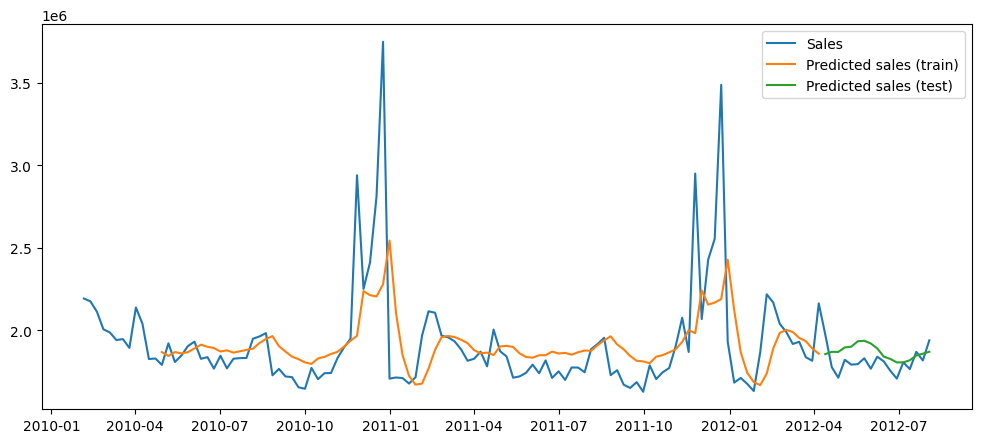

Epoch 1/100
2/2 [==============================] - 3s 13ms/step - loss: 0.0692
Epoch 2/100
2/2 [==============================] - 0s 16ms/step - loss: 0.0558
Epoch 3/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0448
Epoch 4/100
2/2 [==============================] - 0s 21ms/step - loss: 0.0357
Epoch 5/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0296
Epoch 6/100
2/2 [==============================] - 0s 26ms/step - loss: 0.0256
Epoch 7/100
2/2 [==============================] - 0s 23ms/step - loss: 0.0244
Epoch 8/100
2/2 [==============================] - 0s 17ms/step - loss: 0.0253
Epoch 9/100
2/2 [==============================] - 0s 27ms/step - loss: 0.0267
Epoch 10/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0273
Epoch 11/100
2/2 [==============================] - 0s 17ms/step - loss: 0.0267
Epoch 12/100
2/2 [==============================] - 0s 22ms/step - loss: 0.0255
Epoch 13/100
2/2 [==============================]

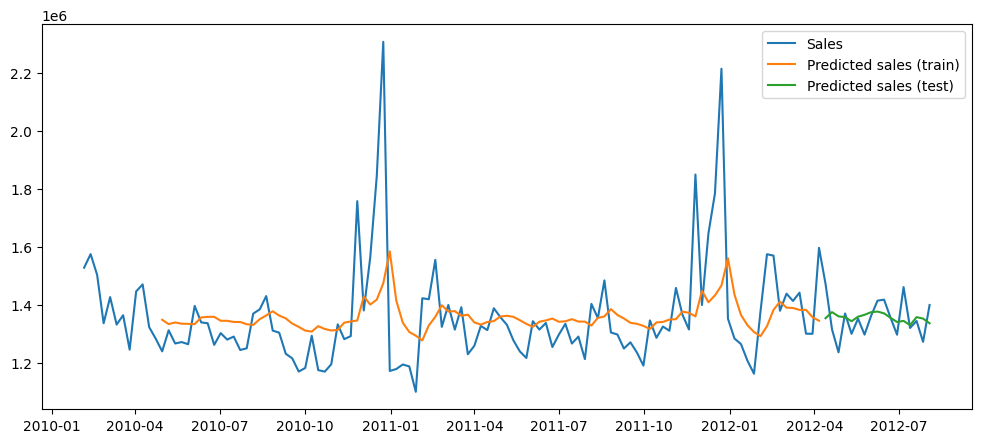

Epoch 1/100
2/2 [==============================] - 3s 9ms/step - loss: 0.0799
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0630
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0497
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0399
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0318
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0283
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0283
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0292
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0307
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0305
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0291
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0280
Epoch 13/100
2/2 [==============================] - 0s 10

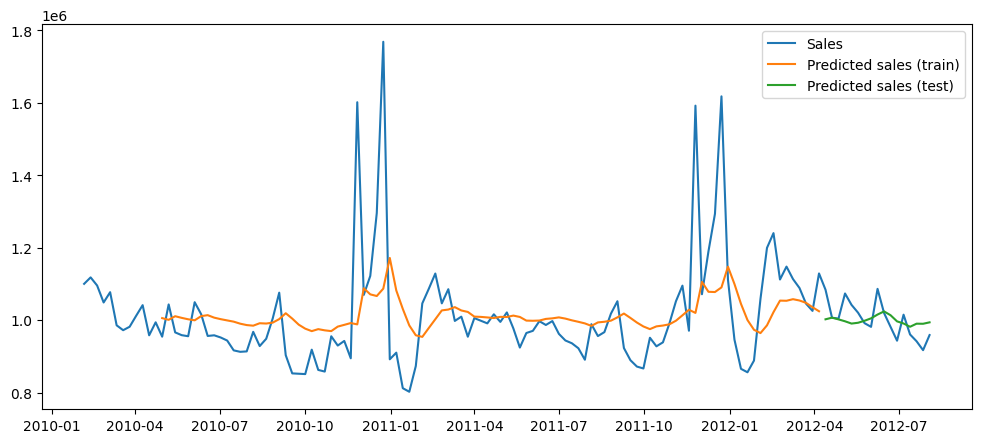

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.0469
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0382
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0319
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0273
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0245
Epoch 6/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0254
Epoch 7/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0266
Epoch 8/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0265
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0255
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0246
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0242
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0240
Epoch 13/100
2/2 [==============================]

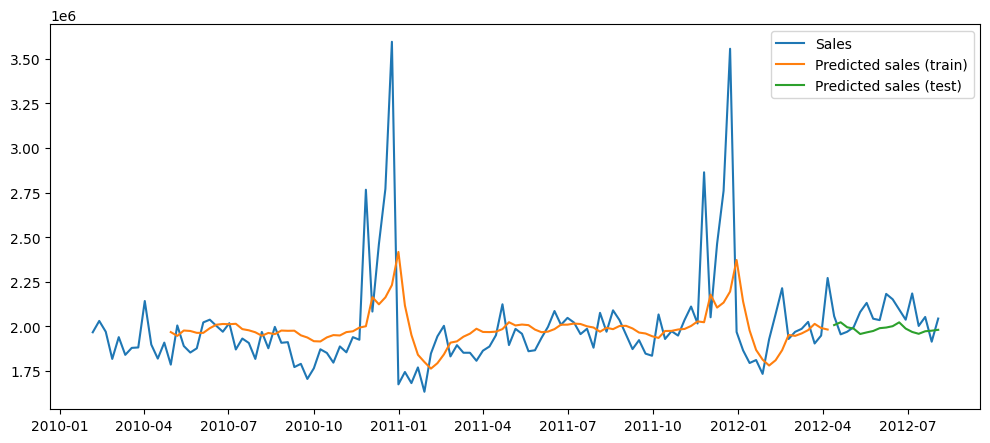

Epoch 1/100
2/2 [==============================] - 2s 11ms/step - loss: 0.1126
Epoch 2/100
2/2 [==============================] - 0s 17ms/step - loss: 0.0878
Epoch 3/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0679
Epoch 4/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0508
Epoch 5/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0374
Epoch 6/100
2/2 [==============================] - 0s 20ms/step - loss: 0.0273
Epoch 7/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0220
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0209
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0230
Epoch 10/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0251
Epoch 11/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0247
Epoch 12/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0230
Epoch 13/100
2/2 [==============================]

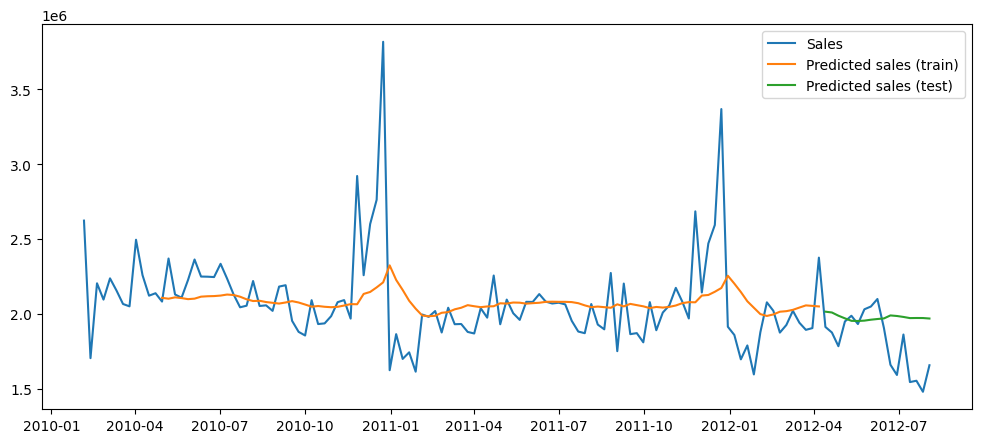

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0480
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0362
Epoch 3/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0287
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0245
Epoch 5/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0232
Epoch 6/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0242
Epoch 7/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0252
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0250
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0241
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0233
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0228
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0223
Epoch 13/100
2/2 [==============================] 

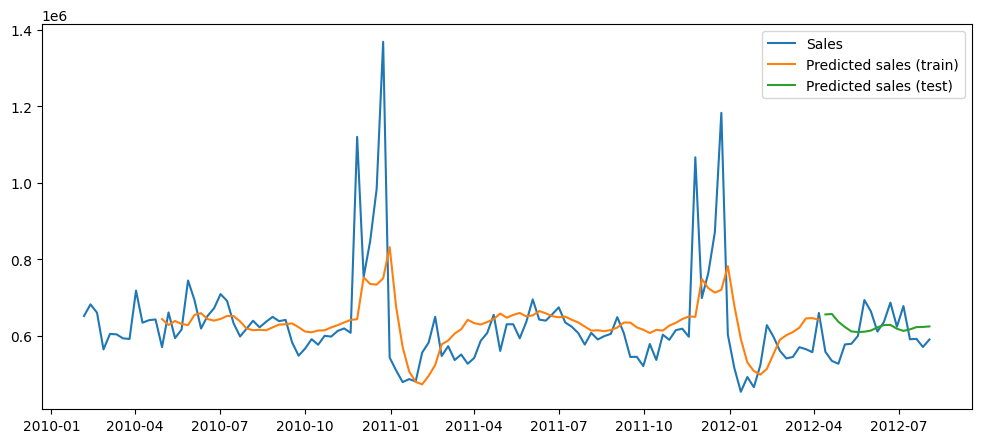

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0861
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0660
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0497
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0373
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0287
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0238
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0233
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0255
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0270
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0265
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0244
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0232
Epoch 13/100
2/2 [==============================] - 0s 

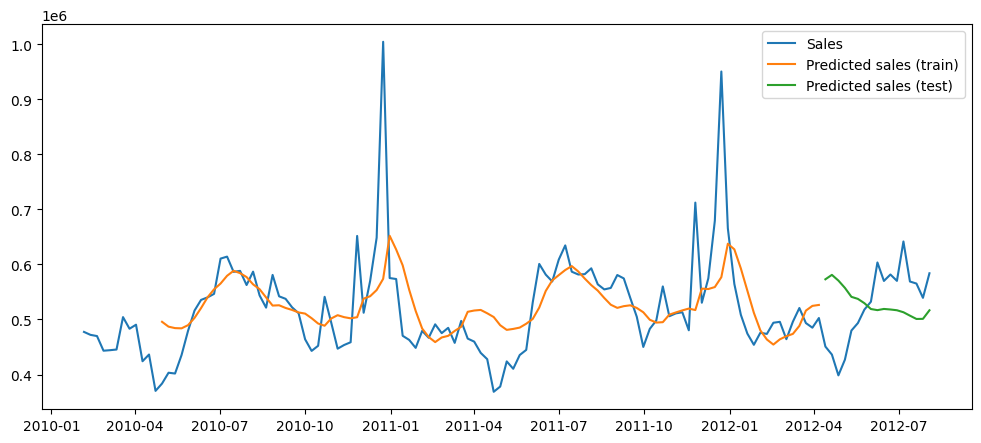

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.1742
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.1365
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.1039
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0784
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0565
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0407
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0305
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0279
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0319
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0355
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0366
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0347
Epoch 13/100
2/2 [==============================] - 0s 8m

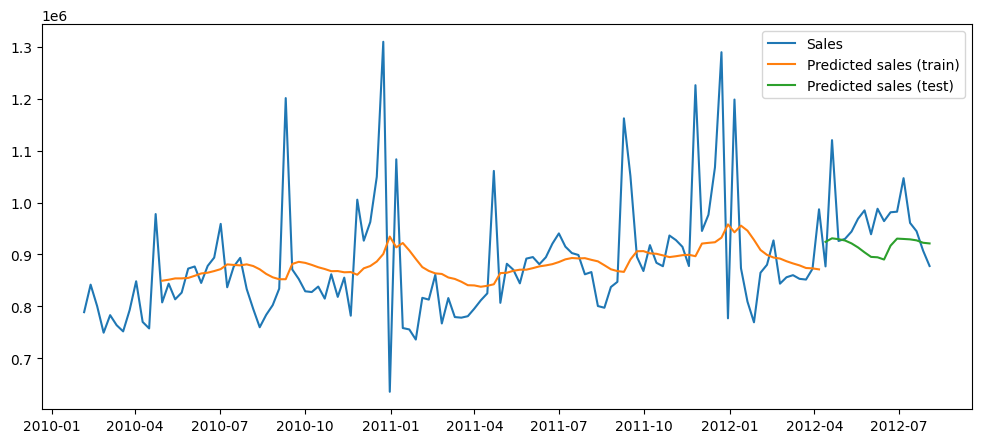

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.1019
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0750
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0525
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0350
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0234
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0192
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0227
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0267
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0263
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0230
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0199
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0190
Epoch 13/100
2/2 [==============================] - 0s 9m

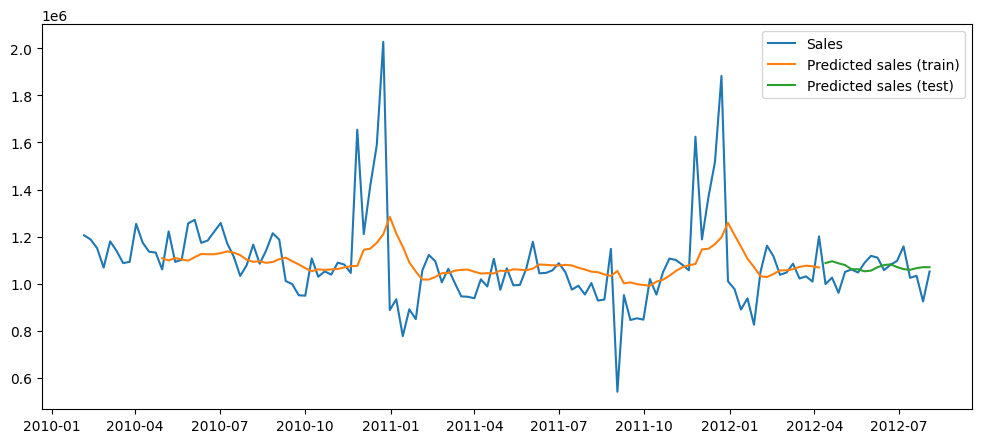

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.0632
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0534
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0445
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0372
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0321
Epoch 6/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0276
Epoch 7/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0243
Epoch 8/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0226
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0220
Epoch 10/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0229
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0235
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0236
Epoch 13/100
2/2 [==============================] 

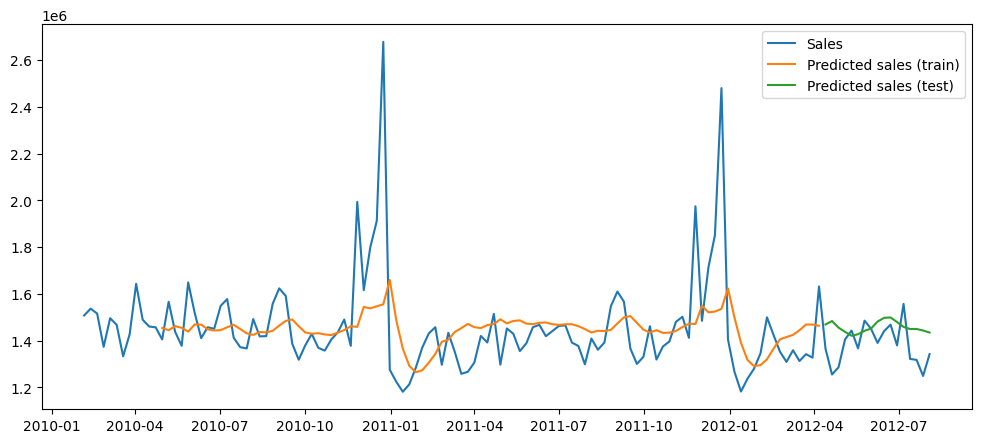

Epoch 1/100
2/2 [==============================] - 2s 11ms/step - loss: 0.0567
Epoch 2/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0447
Epoch 3/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0344
Epoch 4/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0289
Epoch 5/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0252
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0243
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0251
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0260
Epoch 9/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0262
Epoch 10/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0256
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0248
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0240
Epoch 13/100
2/2 [==============================] -

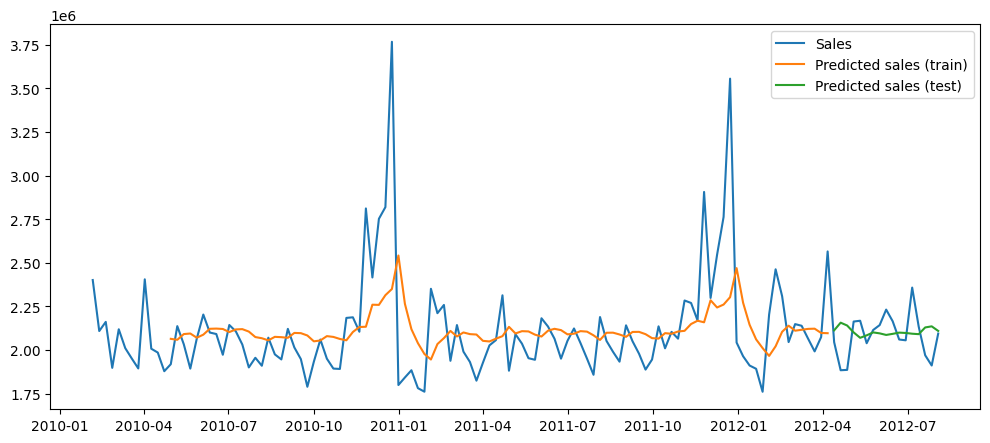

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.0545
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0445
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0359
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0297
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0252
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0233
Epoch 7/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0238
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0244
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0245
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0238
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0229
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0223
Epoch 13/100
2/2 [==============================] - 

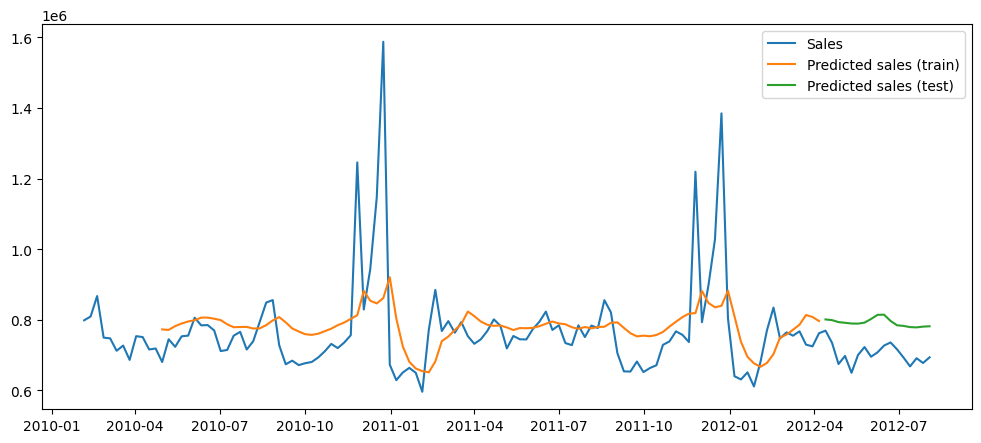

Epoch 1/100
2/2 [==============================] - 2s 11ms/step - loss: 0.0721
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0568
Epoch 3/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0447
Epoch 4/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0357
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0288
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0265
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0277
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0295
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0299
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0287
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0270
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0261
Epoch 13/100
2/2 [==============================] -

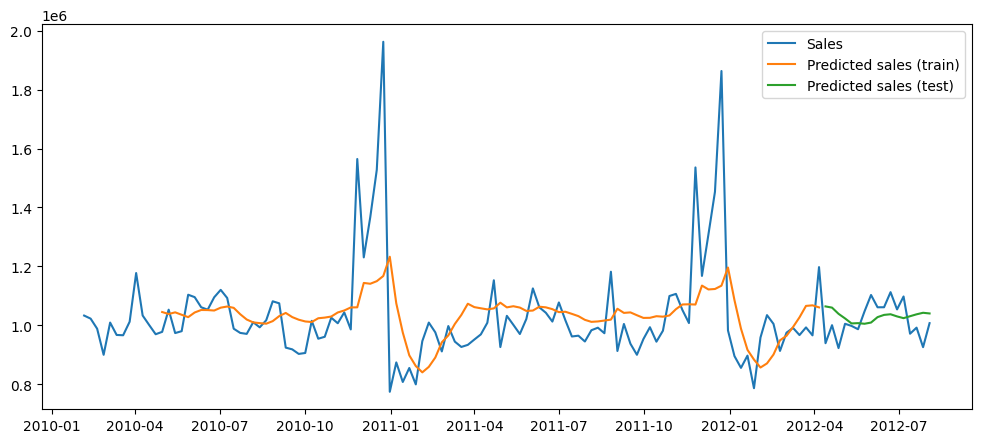

Epoch 1/100
2/2 [==============================] - 1s 10ms/step - loss: 0.0618
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0497
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0394
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0325
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0286
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0286
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0302
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0311
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0301
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0290
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0280
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0272
Epoch 13/100
2/2 [==============================] - 0s 11

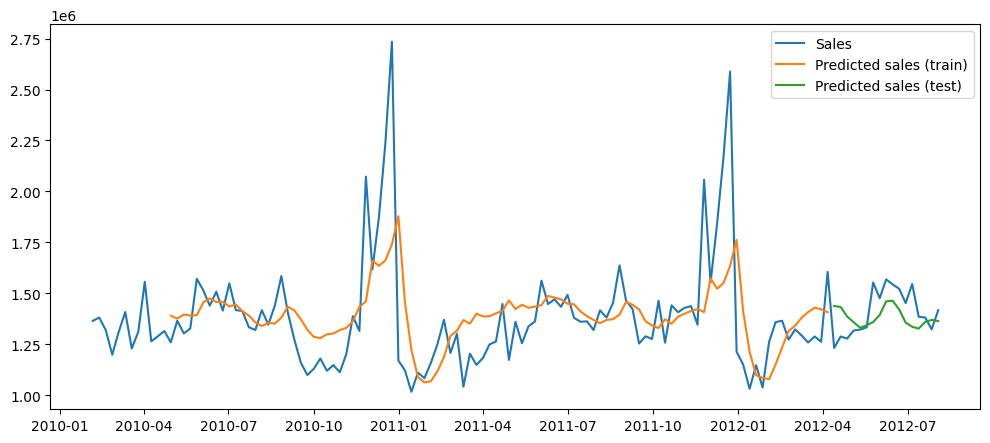

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0772
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0617
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0475
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0363
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0273
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0224
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0211
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0237
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0255
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0250
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0232
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0217
Epoch 13/100
2/2 [==============================] - 0s 

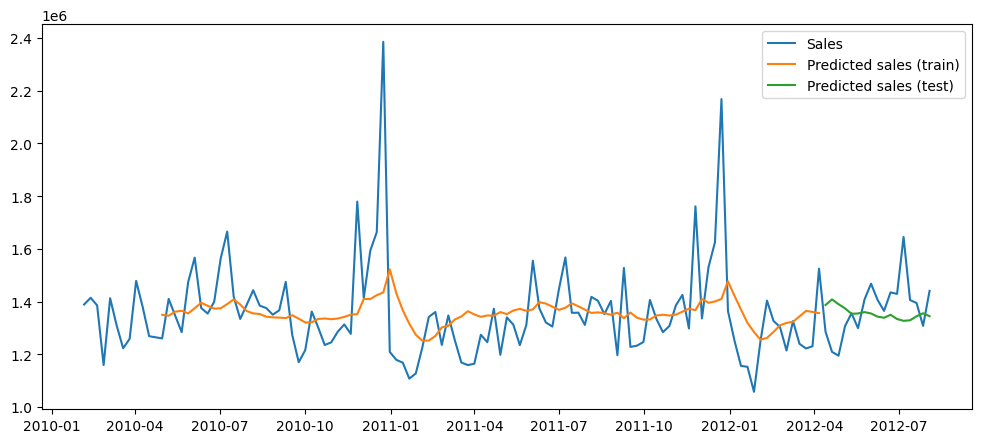

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0579
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0455
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0370
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0314
Epoch 5/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0308
Epoch 6/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0323
Epoch 7/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0337
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0332
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0317
Epoch 10/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0302
Epoch 11/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0290
Epoch 12/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0288
Epoch 13/100
2/2 [==============================] -

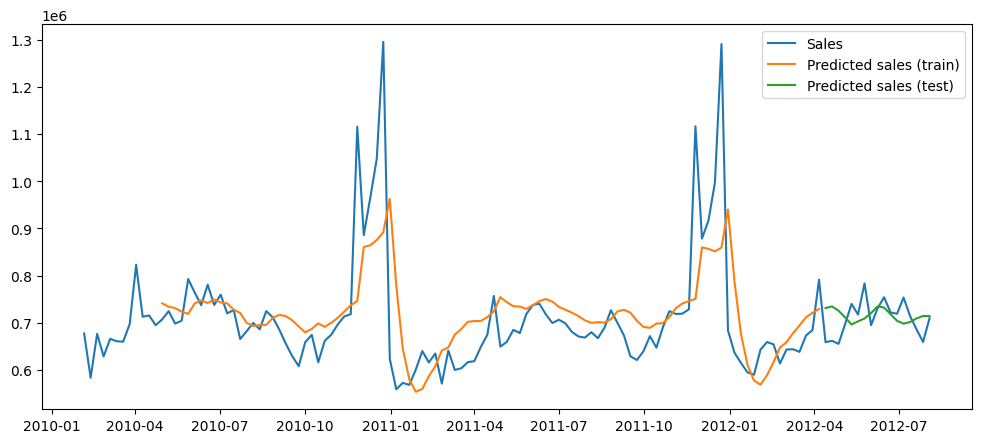

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.1024
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0839
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0681
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0541
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0434
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0353
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0291
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0272
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0281
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0300
Epoch 11/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0308
Epoch 12/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0298
Epoch 13/100
2/2 [==============================] 

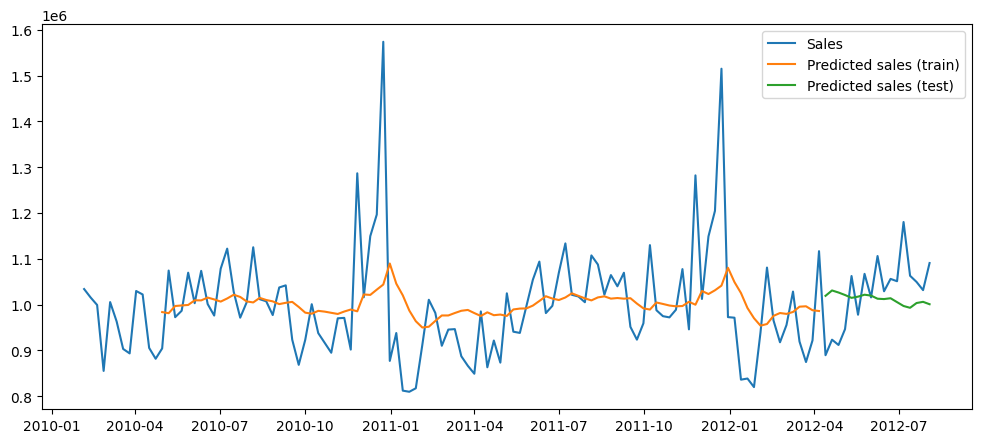

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.0870
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0649
Epoch 3/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0475
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0331
Epoch 5/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0240
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0222
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0242
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0271
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0267
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0245
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0225
Epoch 12/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0210
Epoch 13/100
2/2 [==============================] - 0

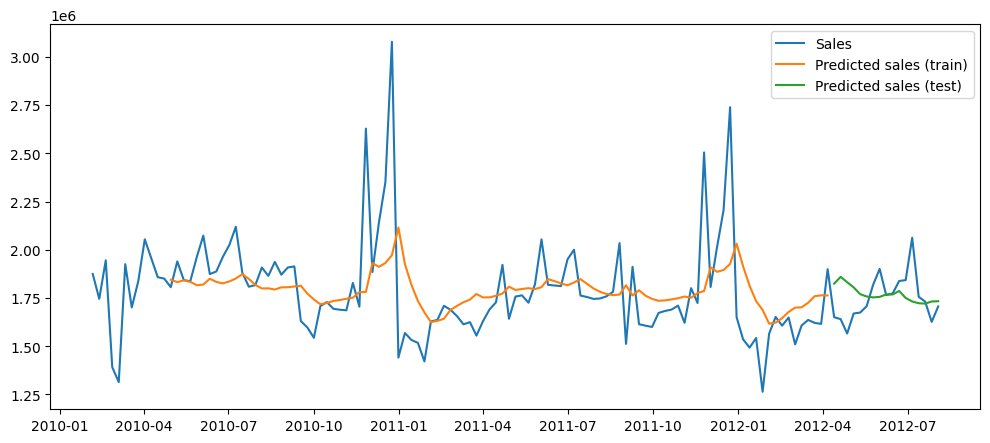

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.1323
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.1093
Epoch 3/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0909
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0746
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0620
Epoch 6/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0523
Epoch 7/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0452
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0418
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0422
Epoch 10/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0446
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0459
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0454
Epoch 13/100
2/2 [==============================] 

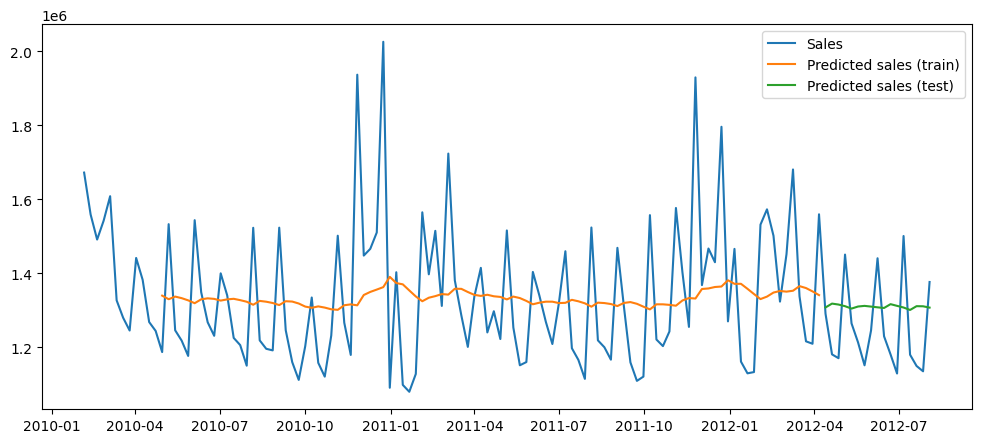

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0524
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0420
Epoch 3/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0331
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0281
Epoch 5/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0245
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0249
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0262
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0271
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0265
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0255
Epoch 11/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0244
Epoch 12/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0238
Epoch 13/100
2/2 [==============================] - 

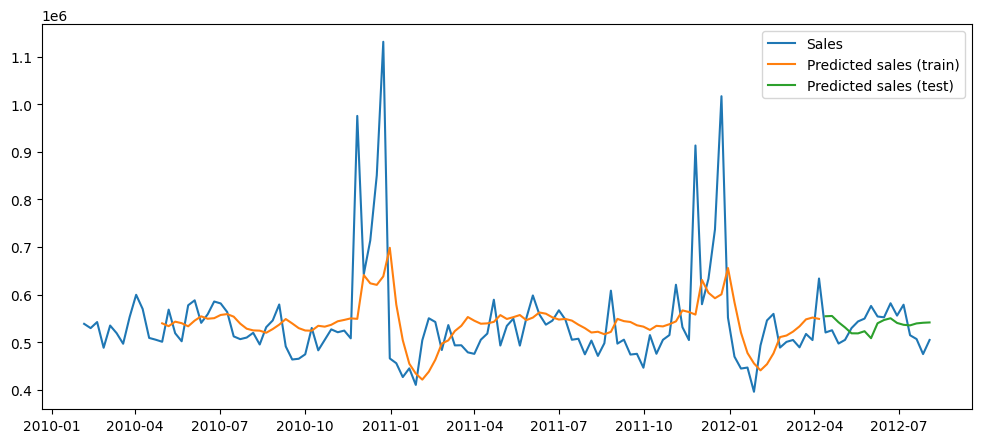

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.2686
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.2027
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.1482
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.1031
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0673
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0406
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0257
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0202
Epoch 9/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0240
Epoch 10/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0309
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0333
Epoch 12/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0305
Epoch 13/100
2/2 [==============================] - 0s

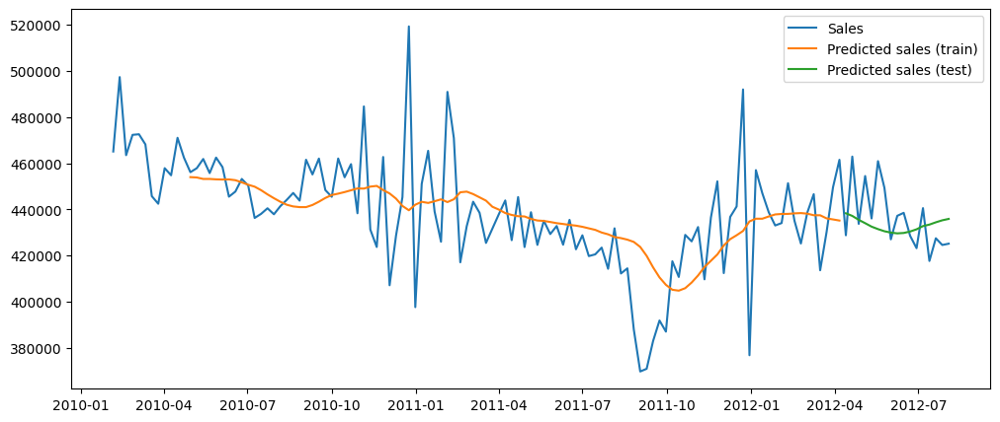

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0815
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0658
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0536
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0430
Epoch 5/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0350
Epoch 6/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0288
Epoch 7/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0270
Epoch 8/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0263
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0280
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0291
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0290
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0280
Epoch 13/100
2/2 [==============================] - 

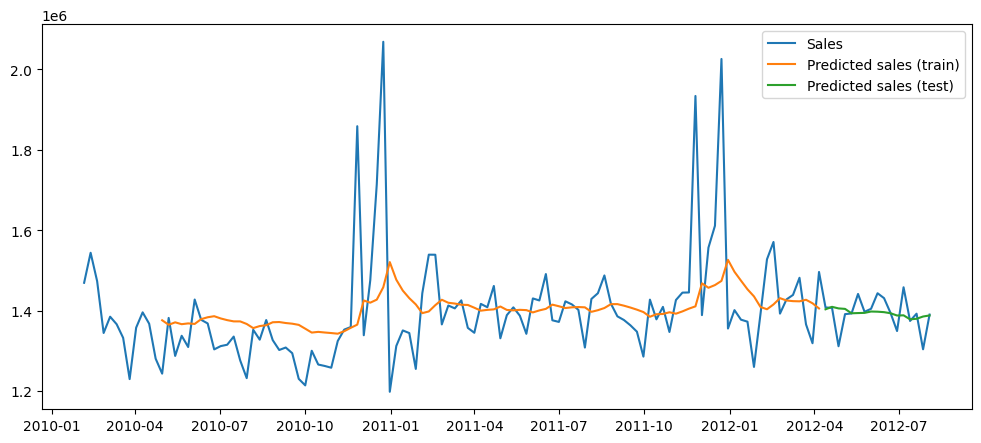

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.0685
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0550
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0427
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0334
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0276
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0256
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0273
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0290
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0287
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0274
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0262
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0251
Epoch 13/100
2/2 [==============================] - 0s 

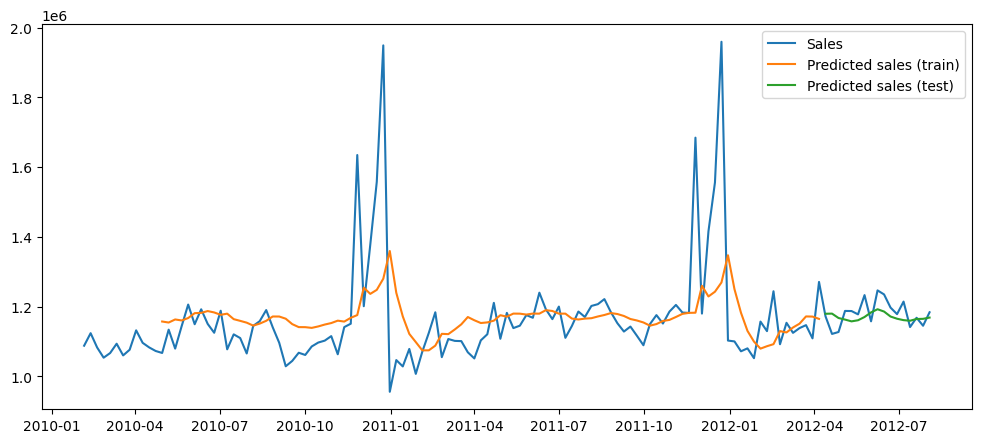

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.1451
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.1074
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0761
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0511
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0353
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0273
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0285
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0336
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0363
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0347
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0305
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0280
Epoch 13/100
2/2 [==============================] -

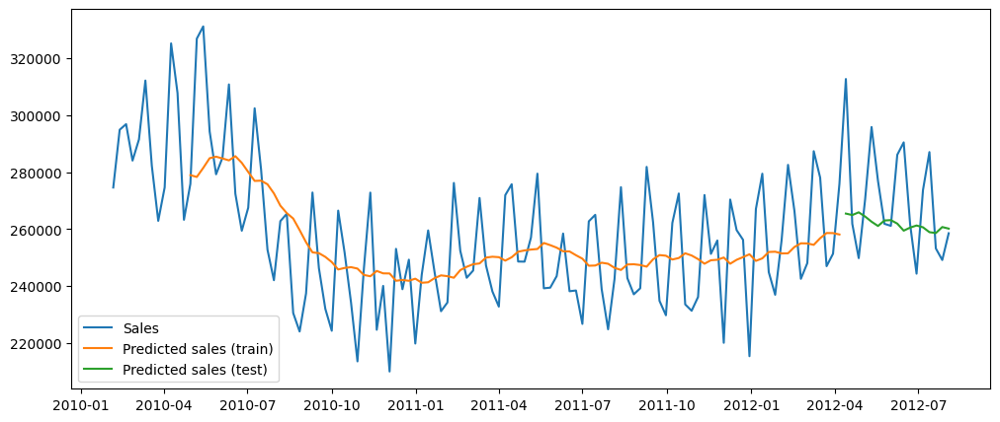

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.0555
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0431
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0339
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0277
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0250
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0245
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0258
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0266
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0262
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0253
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0243
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0240
Epoch 13/100
2/2 [==============================] - 0s 9ms

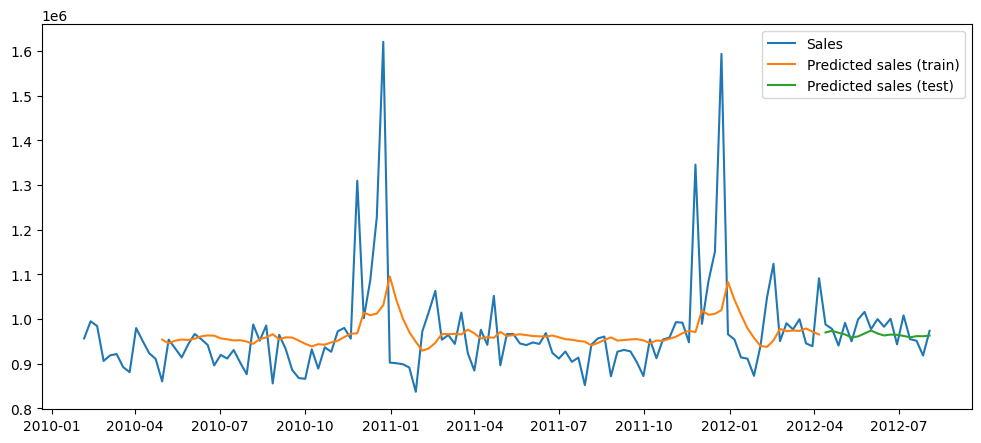

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.1081
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0805
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0595
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0441
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0358
Epoch 6/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0324
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0356
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0375
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0375
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0357
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0336
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0323
Epoch 13/100
2/2 [==============================] - 0s

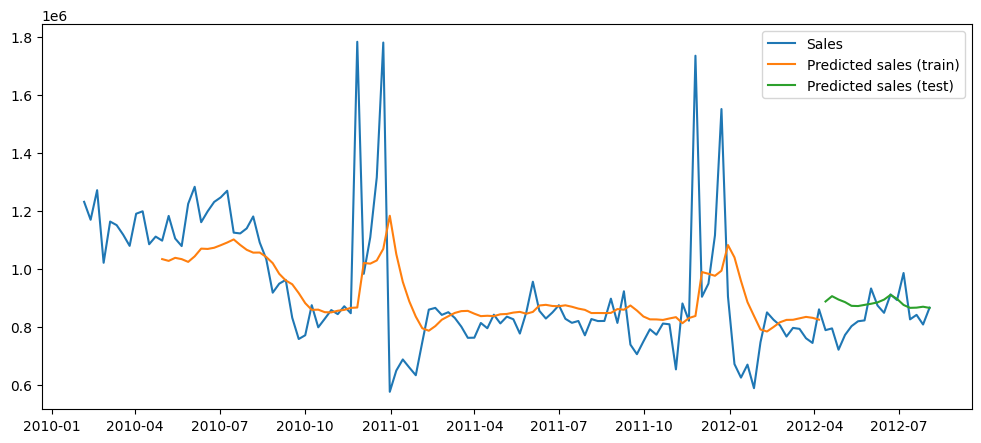

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.5512
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.4500
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.3633
Epoch 4/100
2/2 [==============================] - 0s 16ms/step - loss: 0.2858
Epoch 5/100
2/2 [==============================] - 0s 13ms/step - loss: 0.2155
Epoch 6/100
2/2 [==============================] - 0s 14ms/step - loss: 0.1542
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.1003
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0559
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0265
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0175
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0248
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0386
Epoch 13/100
2/2 [==============================] - 0

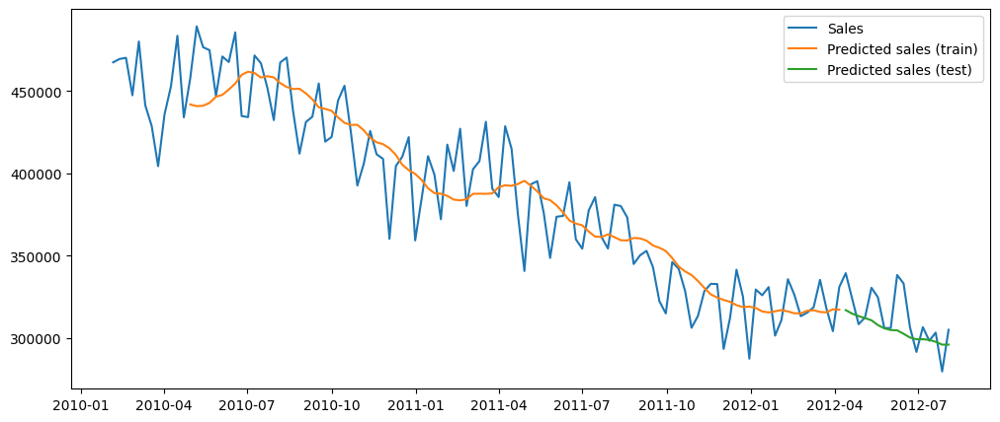

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.3024
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.2470
Epoch 3/100
2/2 [==============================] - 0s 12ms/step - loss: 0.1980
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.1556
Epoch 5/100
2/2 [==============================] - 0s 13ms/step - loss: 0.1174
Epoch 6/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0844
Epoch 7/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0559
Epoch 8/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0361
Epoch 9/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0235
Epoch 10/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0222
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0285
Epoch 12/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0345
Epoch 13/100
2/2 [==============================]

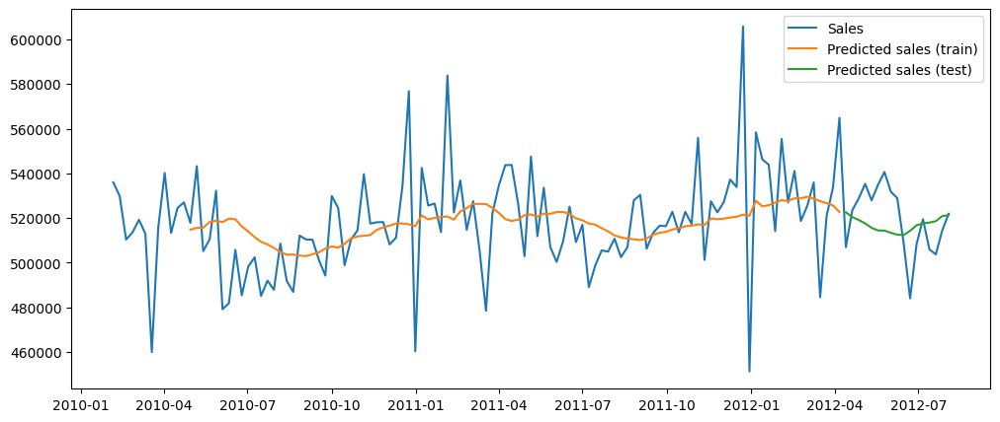

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.1764
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.1469
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.1179
Epoch 4/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0938
Epoch 5/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0711
Epoch 6/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0518
Epoch 7/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0346
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0245
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0196
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0228
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0273
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0272
Epoch 13/100
2/2 [==============================] - 0s 

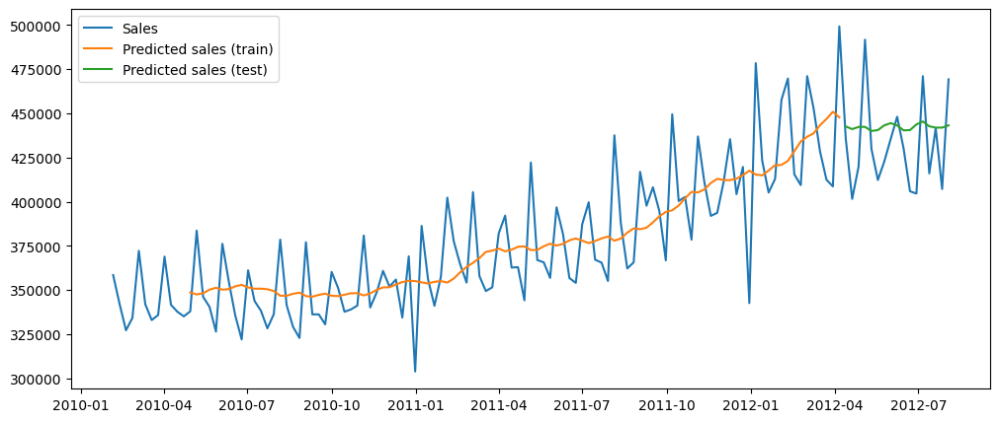

Epoch 1/100
2/2 [==============================] - 1s 9ms/step - loss: 0.0586
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0455
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0353
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0295
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0274
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0291
Epoch 7/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0306
Epoch 8/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0305
Epoch 9/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0291
Epoch 10/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0281
Epoch 11/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0270
Epoch 12/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0266
Epoch 13/100
2/2 [==============================] 

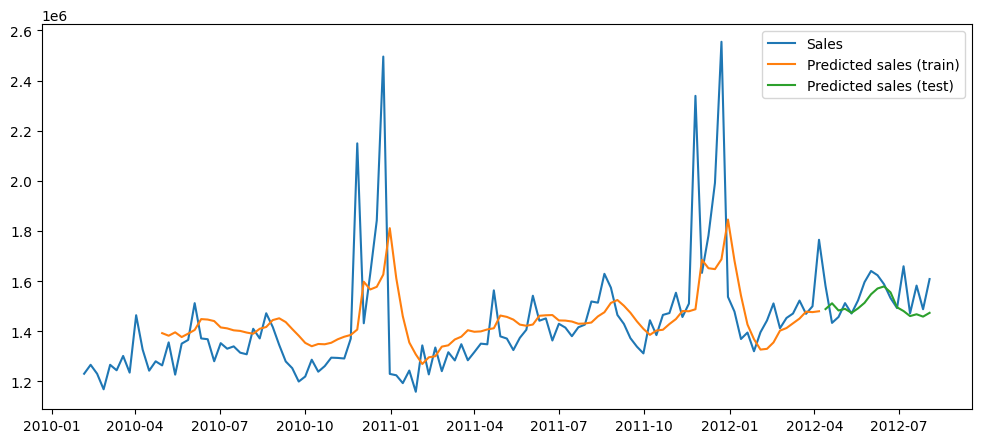

Epoch 1/100
2/2 [==============================] - 2s 12ms/step - loss: 0.0750
Epoch 2/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0569
Epoch 3/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0434
Epoch 4/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0322
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0259
Epoch 6/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0234
Epoch 7/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0241
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0264
Epoch 9/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0271
Epoch 10/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0263
Epoch 11/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0243
Epoch 12/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0234
Epoch 13/100
2/2 [==============================]

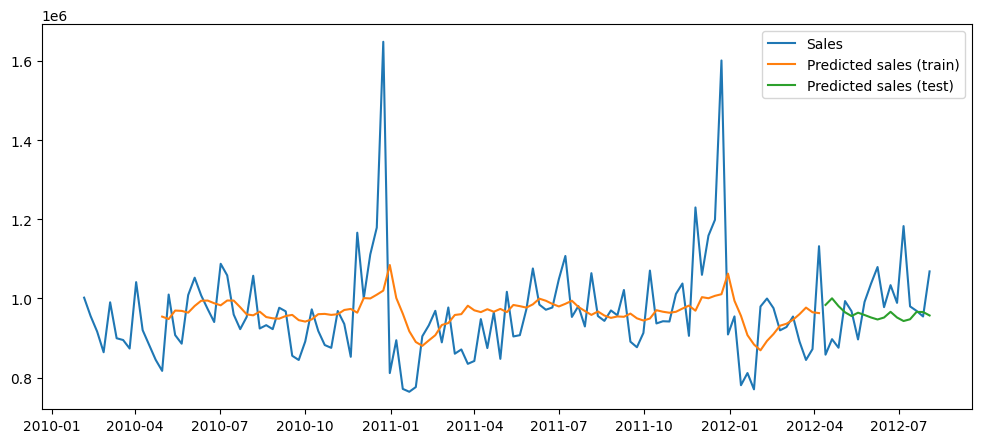

Epoch 1/100
2/2 [==============================] - 2s 11ms/step - loss: 0.0675
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0535
Epoch 3/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0415
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0319
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0269
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0247
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0264
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0279
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0281
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0269
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0256
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0248
Epoch 13/100
2/2 [==============================] - 0

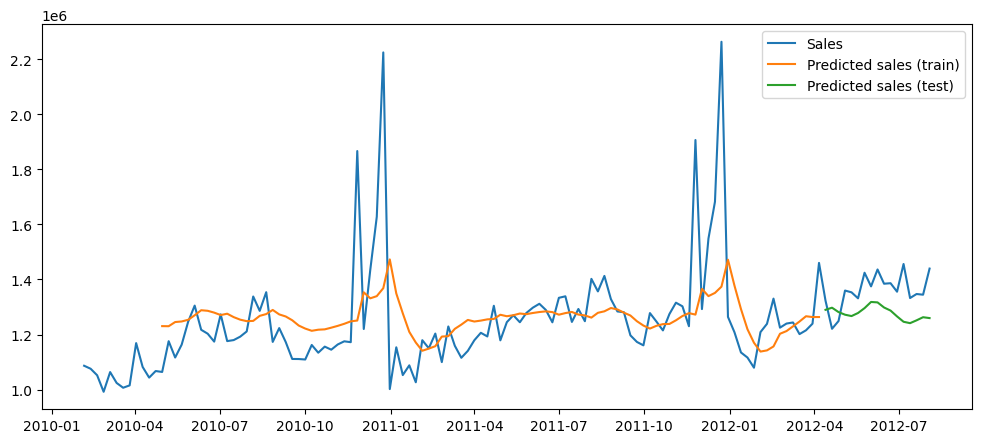

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.4119
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.3307
Epoch 3/100
2/2 [==============================] - 0s 12ms/step - loss: 0.2623
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.2060
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.1573
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.1169
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0859
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0598
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0458
Epoch 10/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0403
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0451
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0516
Epoch 13/100
2/2 [==============================] 

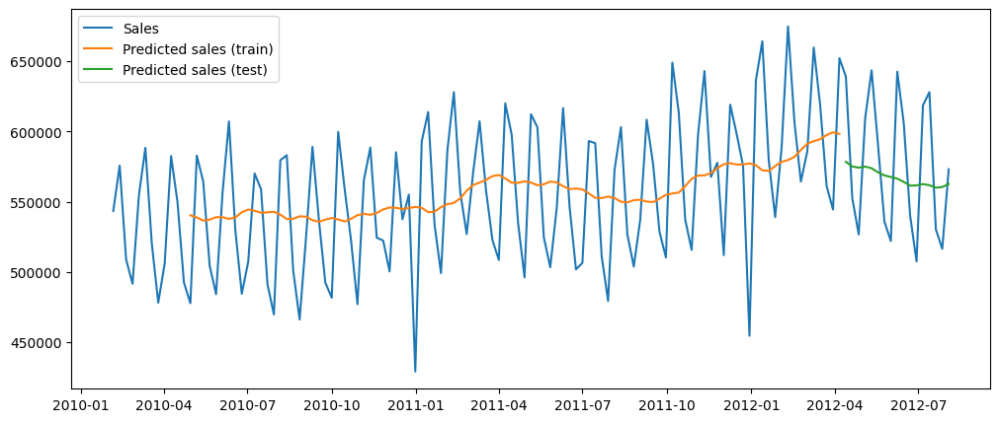

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.2989
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.2190
Epoch 3/100
2/2 [==============================] - 0s 14ms/step - loss: 0.1494
Epoch 4/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0921
Epoch 5/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0516
Epoch 6/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0338
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0398
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0539
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0562
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0470
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0380
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0332
Epoch 13/100
2/2 [==============================] -

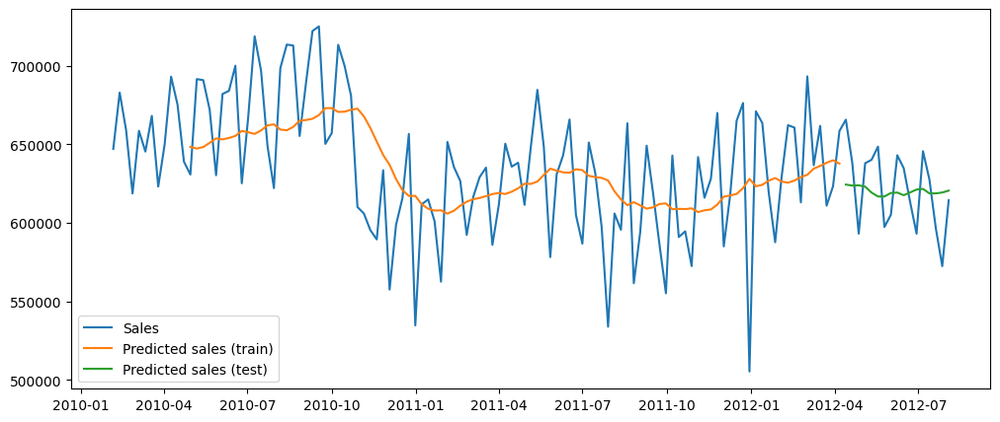

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.2867
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.2314
Epoch 3/100
2/2 [==============================] - 0s 11ms/step - loss: 0.1840
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.1420
Epoch 5/100
2/2 [==============================] - 0s 15ms/step - loss: 0.1063
Epoch 6/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0761
Epoch 7/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0509
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0315
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0193
Epoch 10/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0153
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0187
Epoch 12/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0247
Epoch 13/100
2/2 [==============================] 

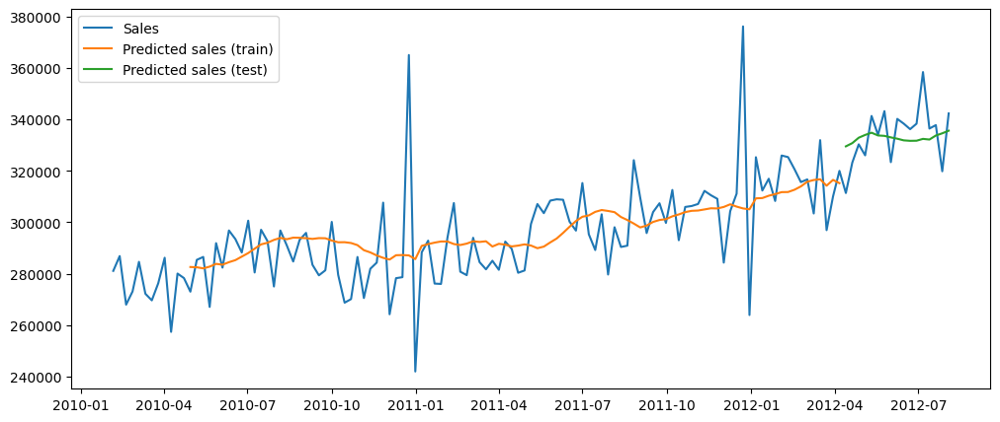

Epoch 1/100
2/2 [==============================] - 5s 18ms/step - loss: 0.0532
Epoch 2/100
2/2 [==============================] - 0s 18ms/step - loss: 0.0429
Epoch 3/100
2/2 [==============================] - 0s 21ms/step - loss: 0.0349
Epoch 4/100
2/2 [==============================] - 0s 17ms/step - loss: 0.0287
Epoch 5/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0243
Epoch 6/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0213
Epoch 7/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0204
Epoch 8/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0213
Epoch 9/100
2/2 [==============================] - 0s 17ms/step - loss: 0.0221
Epoch 10/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0220
Epoch 11/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0214
Epoch 12/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0206
Epoch 13/100
2/2 [==============================]

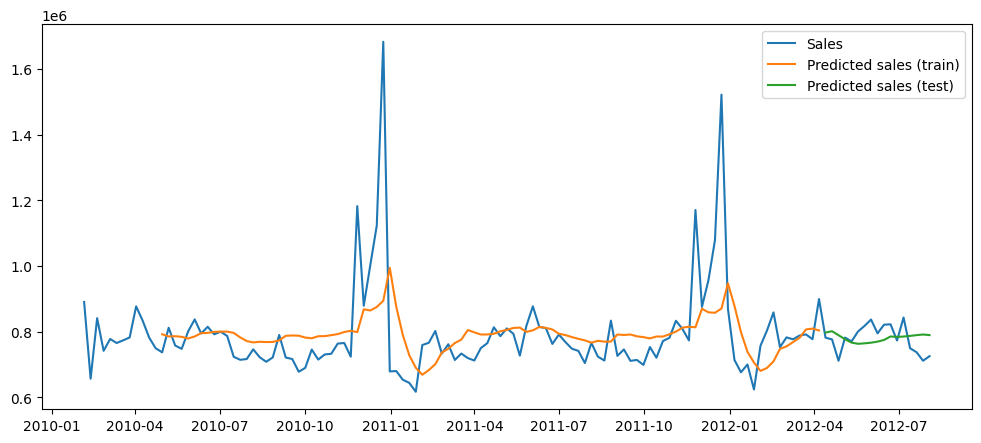

In [82]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

def create_sequences(data, lookback):
    X, y = [], []
    for i in range(len(data) - lookback):
        X.append(data[i:(i + lookback), 0])
        y.append(data[i + lookback, 0])
    return np.array(X), np.array(y)

lookback = 12

for store in dataset['Store'].unique():

    tmp = dataset[dataset['Store'] == store].reset_index(drop=True)
    sales = tmp['Weekly_Sales'].values.reshape(-1, 1)

    scaler = MinMaxScaler(feature_range=(0, 1))
    sales_normalized = scaler.fit_transform(sales)

    train_size = int(len(sales_normalized) * 0.8)
    test_size = len(sales_normalized) - train_size
    train_data, test_data = sales_normalized[0:train_size], sales_normalized[train_size:len(sales_normalized)]

    X_train, y_train = create_sequences(train_data, lookback)
    X_test, y_test = create_sequences(test_data, lookback)

    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

    model = Sequential()
    model.add(LSTM(50, input_shape=(lookback, 1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    model.fit(X_train, y_train, epochs=100, batch_size=64, verbose=1)

    train_predictions = model.predict(X_train)
    test_predictions = model.predict(X_test)

    train_predictions = scaler.inverse_transform(train_predictions)
    y_train = scaler.inverse_transform([y_train])
    test_predictions = scaler.inverse_transform(test_predictions)
    y_test = scaler.inverse_transform([y_test])

    plt.figure(figsize=(12, 5))
    plt.plot(tmp.iloc[:-lookback]['Date'], sales[:-lookback], label='Sales')
    plt.plot(
        tmp.iloc[lookback:lookback+len(train_predictions)]['Date'],
        train_predictions,
        label='Predicted sales (train)'
    )
    plt.plot(
        tmp.iloc[lookback+len(train_predictions):lookback+len(train_predictions)+len(test_predictions)]['Date'],
        test_predictions,
        label='Predicted sales (test)'
    )
    plt.legend()
    plt.show()

O modelo ARIMA, apesar de apresentar baixo valor de erro, foi incapaz de generalizar as previsões para valores futuros, apresentando valor constante quando solicitada uma previsão futura. Por outro lado, o modelo RNN não apresentou bom ajuste aos dados, apresentando valor de erro significante. Deve ser aplicada uma técnica de otimização dos hiperparâmetros para ambos os modelos afim de aprimorar os resultados.

### Modelos de regressão

#### Modelo geral para todas as lojas com One Hot Encoding

In [101]:
from sklearn.ensemble import RandomForestRegressor

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error, r2_score

import matplotlib.pyplot as plt

y = dataset['Weekly_Sales']

X = dataset.copy()
X['year'] = X['Date'].dt.year
X['quarter'] = X['Date'].dt.quarter
X['month'] = X['Date'].dt.month
X['dayOfYear'] = X['Date'].dt.dayofyear
X['day'] = X['Date'].dt.day
X['weekday'] = X['Date'].dt.weekday
X['weekOfMonth'] = X['Date'].apply(lambda x: (x.day-1) // 7 + 1)
X['weekOfYear'] = X['Date'].dt.weekofyear
X = pd.get_dummies(X, columns=['Store'])
X = X.drop(columns=['Date', 'Weekly_Sales'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

model = RandomForestRegressor(n_estimators=1000, random_state=42)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

MAPE = mean_absolute_percentage_error(y_test, y_pred)
R2 = r2_score(y_test, y_pred)

print('MAPE:', MAPE)
print('R2:', R2)

MAPE: 0.04750460136739008
R2: 0.9595211522510646


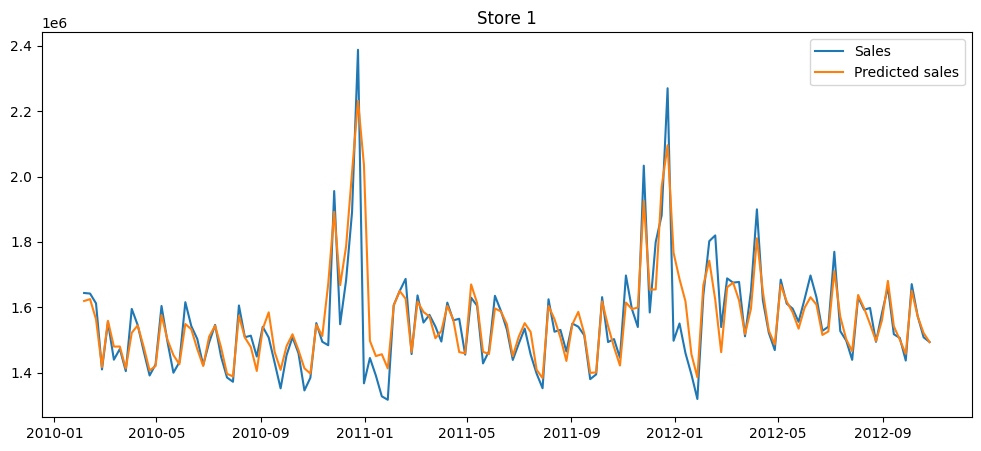

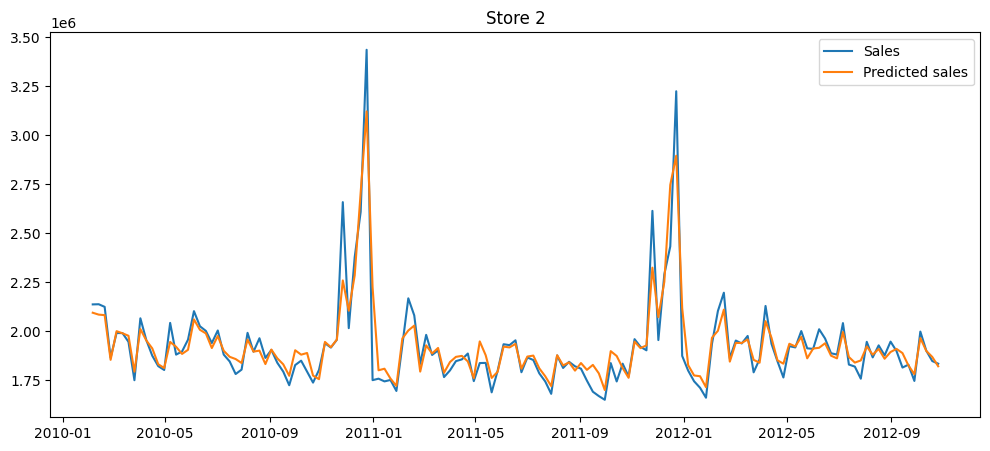

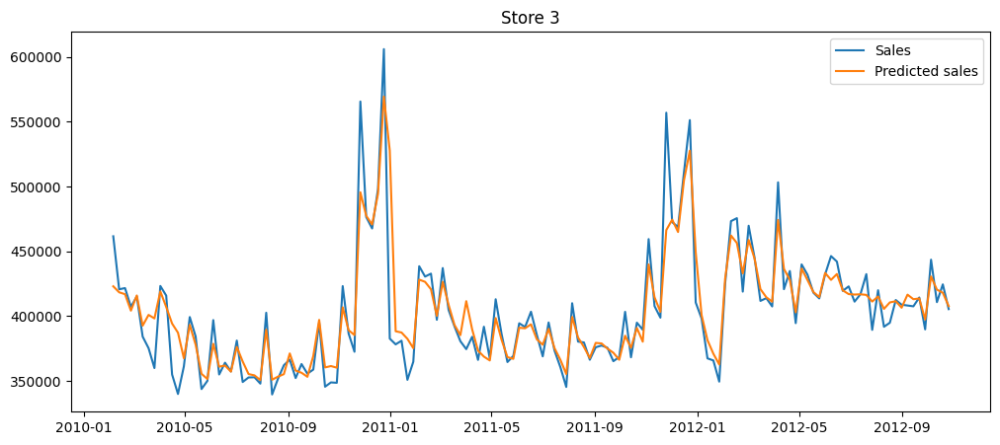

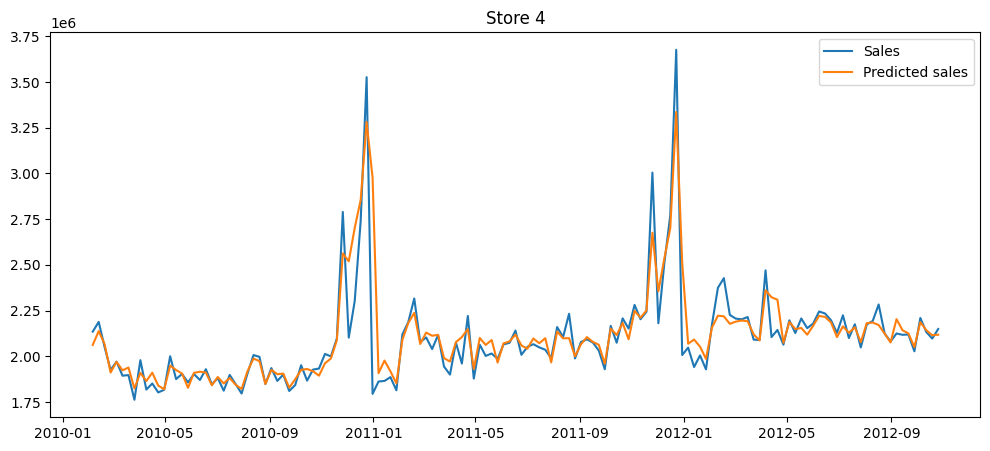

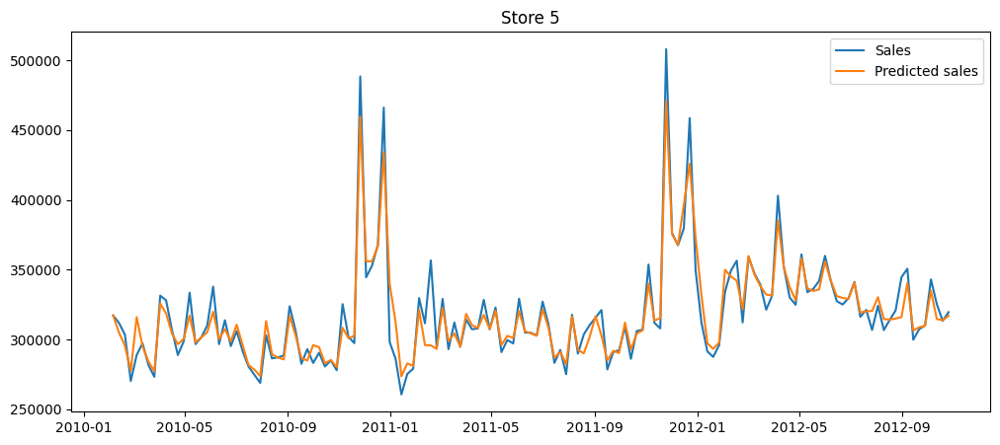

...

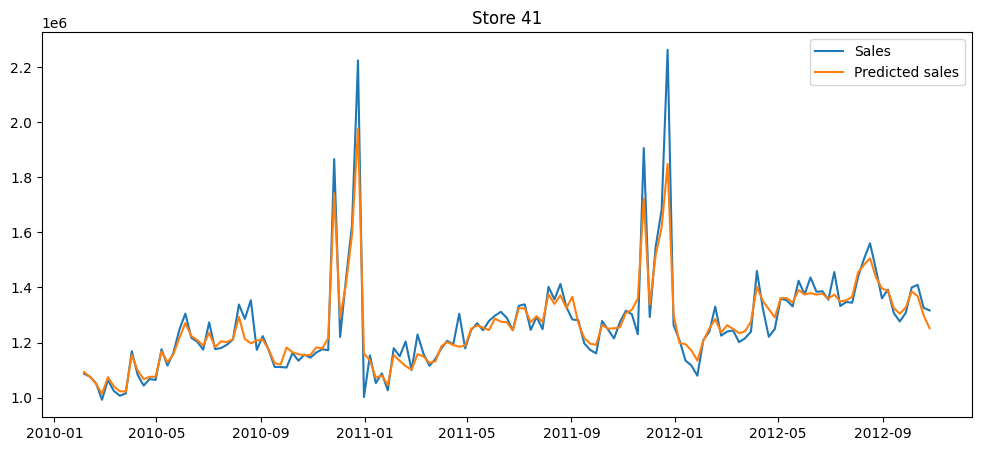

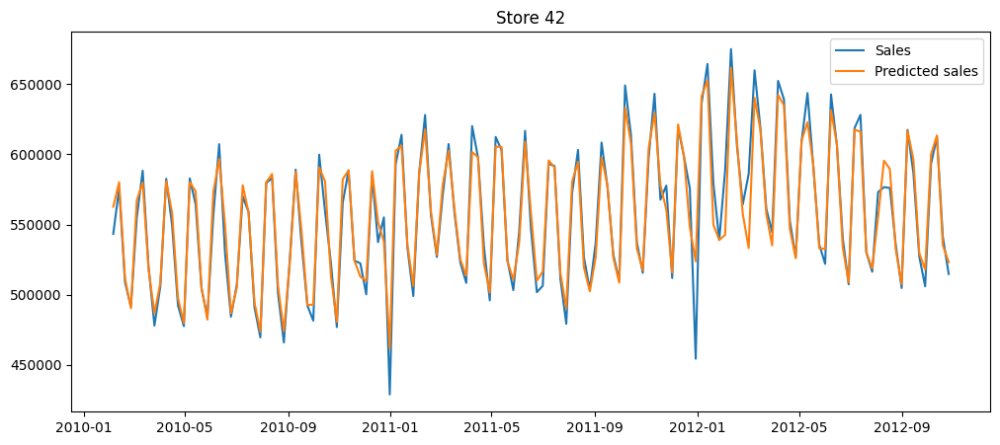

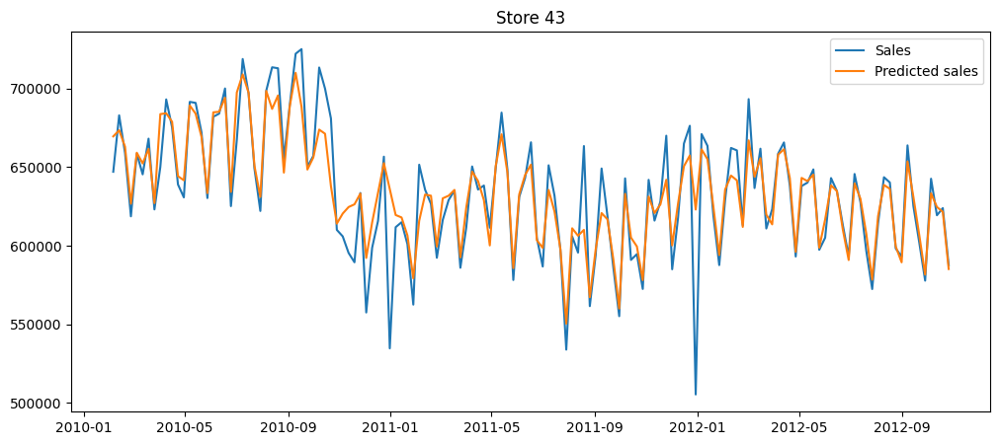

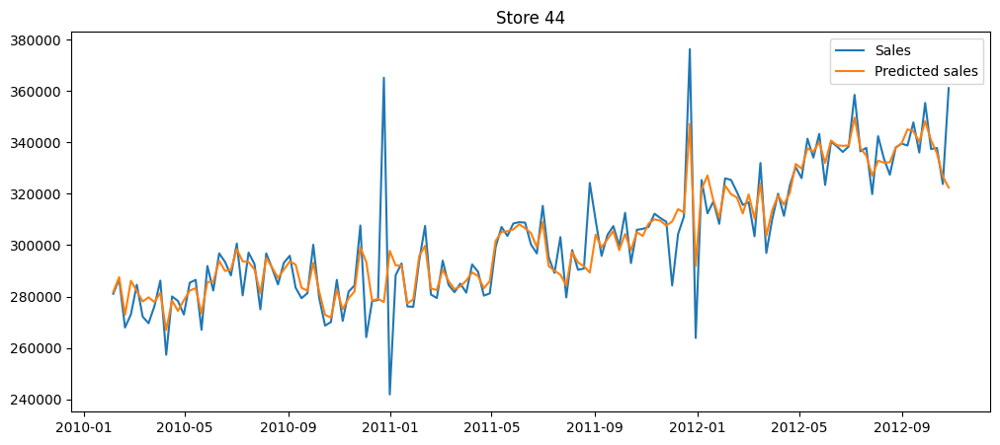

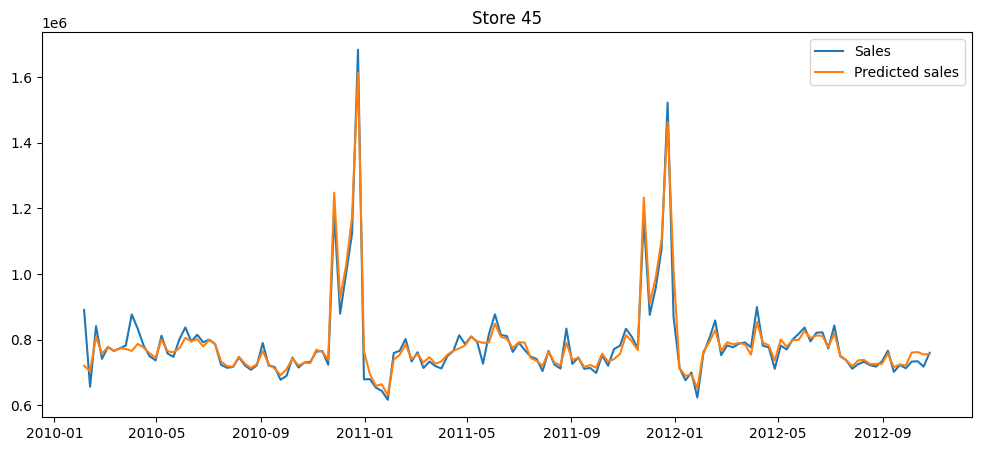

In [102]:
for store in dataset['Store'].unique():
    plt.figure(figsize=(12, 5))
    plt.plot(
        dataset[dataset['Store'] == store]['Date'],
        dataset[dataset['Store'] == store]['Weekly_Sales'],
        label='Sales'
    )
    plt.plot(
        pd.to_datetime(X[X[f'Store_{store}'] == 1][['year', 'month', 'day']]),
        model.predict(X[X[f'Store_{store}'] == 1]),
        label='Predicted sales'
    )

    plt.title(f'Store {store}')
    plt.legend()
    plt.show()